# Grouping

In [22]:
#Import libs
import pandas as pd
import numpy as np
import os

In [23]:
#import dataset
ords_prods_merge = pd.read_pickle(r'D:\PythonPrjkt\Instacart Basket Analysis\02_Data\2.7_Prepared data\Orders_products_merged.pkl')

In [24]:
ords_prods_merge.head()

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both
1,787017,31925,47329,4,3,10,12.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both
3,6612,95113,410,2,1,18,7.0,25146,18,0,25147,Original Orange Juice,31,7,8.4,both
4,15832,83780,982,3,0,20,23.0,25146,32,0,25147,Original Orange Juice,31,7,8.4,both


In [25]:
ords_prods_merge.shape

(290620, 16)

In [26]:
df =  ords_prods_merge

In [27]:
df.head()

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both
1,787017,31925,47329,4,3,10,12.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both
3,6612,95113,410,2,1,18,7.0,25146,18,0,25147,Original Orange Juice,31,7,8.4,both
4,15832,83780,982,3,0,20,23.0,25146,32,0,25147,Original Orange Juice,31,7,8.4,both


## Now testing code lines from the excercise

In [28]:
df.groupby('product_name')

In [29]:
df.groupby('department_id').agg({'order_number': ['mean']})

,order_number
,mean
department_id,
1,15.409539
2,18.923977
3,17.496966
4,17.853703
5,14.926926
6,16.271315
7,17.737778
8,16.478873


In [30]:
df.groupby('department_id')['order_number'].mean()

department_id
1     15.409539
2     18.923977
3     17.496966
4     17.853703
5     14.926926
6     16.271315
7     17.737778
8     16.478873
9     16.334202
10    20.993769
11    16.348437
12    16.198833
13    17.032444
14    16.791264
15    16.471805
16    17.732981
17    16.534155
18    19.606162
19    17.470759
20    16.658763
21    21.932127
Name: order_number, dtype: float64

In [31]:
df.groupby('department_id').agg({'order_number': ['mean', 'min', 'max']})

order_number        
                      mean min max
department_id                     
1                15.409539   1  99
2                18.923977   1  94
3                17.496966   1  99
4                17.853703   1  99
5                14.926926   1  93
6                16.271315   1  98
7                17.737778   1  99
8                16.478873   1  86
9                16.334202   1  98
10               20.993769   1  99
11               16.348437   1  98
12               16.198833   1  98
13               17.032444   1  99
14               16.791264   1  97
15               16.471805   1  99
16               17.732981   1  99
17               16.534155   1  99
18               19.606162   1  96
19               17.470759   1  99
20               16.658763   1  99
21               21.932127   1  94

In [32]:
#df['max_order'] = df.groupby(['user_id'])['order_number'].trasnform(np.max)
df['max_order'] = df.groupby(['user_id'])['order_number'].transform(np.max)

In [33]:
ords_prods_merge['max_order'] = ords_prods_merge.groupby(['user_id'])['order_number'].transform(np.max)

In [34]:
df['max_order'] = df.groupby(['user_id'])['order_number'].transform(np.max)

In [35]:
df.head()

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4
1,787017,31925,47329,4,3,10,12.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4
3,6612,95113,410,2,1,18,7.0,25146,18,0,25147,Original Orange Juice,31,7,8.4,both,28
4,15832,83780,982,3,0,20,23.0,25146,32,0,25147,Original Orange Juice,31,7,8.4,both,6


In [36]:
df.sort_values(by='user_id', ascending=True).head(100)

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4
1179,70,23391,7,17,0,10,28.0,4920,6,1,4920,Seedless Red Grapes,123,4,1.1,both,17
1875,70,23391,7,17,0,10,28.0,4945,7,1,4945,Large Pineapple Chunks,123,4,14.4,both,17
1910,70,23391,7,17,0,10,28.0,17638,8,1,17638,Vanilla Coffee Concentrate,26,7,4.4,both,17
1935,70,23391,7,17,0,10,28.0,11520,9,0,11520,Large Alfresco Eggs,86,16,3.1,both,17
2290,70,23391,7,17,0,10,28.0,32177,10,1,32179,Blood Oranges,24,4,7.0,both,17
2387,70,23391,7,17,0,10,28.0,27344,11,0,27346,Uncured Genoa Salami,96,20,14.8,both,17
374,70,23391,7,17,0,10,28.0,8277,3,1,8277,Apple Honeycrisp Organic,24,4,14.1,both,17
310,70,23391,7,17,0,10,28.0,42803,2,1,42807,Organic Apple Slices,50,19,4.9,both,17


In [37]:
pd.options.display.max_rows = None

In [38]:
df.sort_values(by='user_id', ascending=True).head(100)

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4
1179,70,23391,7,17,0,10,28.0,4920,6,1,4920,Seedless Red Grapes,123,4,1.1,both,17
1875,70,23391,7,17,0,10,28.0,4945,7,1,4945,Large Pineapple Chunks,123,4,14.4,both,17
1910,70,23391,7,17,0,10,28.0,17638,8,1,17638,Vanilla Coffee Concentrate,26,7,4.4,both,17
1935,70,23391,7,17,0,10,28.0,11520,9,0,11520,Large Alfresco Eggs,86,16,3.1,both,17
2290,70,23391,7,17,0,10,28.0,32177,10,1,32179,Blood Oranges,24,4,7.0,both,17
2387,70,23391,7,17,0,10,28.0,27344,11,0,27346,Uncured Genoa Salami,96,20,14.8,both,17
374,70,23391,7,17,0,10,28.0,8277,3,1,8277,Apple Honeycrisp Organic,24,4,14.1,both,17
310,70,23391,7,17,0,10,28.0,42803,2,1,42807,Organic Apple Slices,50,19,4.9,both,17


## Loyalty flags

In [39]:
#apply loyalty labels
df.loc[df['max_order'] > 40, 'loyalty_flag'] = 'Loyal customer'
df.loc[(df['max_order'] <= 40) & (df['max_order'] > 10), 'loyalty_flag'] = 'Regular customer'
df.loc[df['max_order'] <= 10, 'loyalty_flag'] = 'New customer'

In [40]:
df['loyalty_flag'].value_counts()

Regular customer    126252
New customer        109702
Loyal customer       54666
Name: loyalty_flag, dtype: int64

In [41]:
df[['user_id', 'loyalty_flag', 'order_number']].head(60)

,user_id,loyalty_flag,order_number
0,4,New customer,4
1,47329,New customer,4
2,4,New customer,4
3,410,Regular customer,2
4,982,New customer,3
5,1454,Regular customer,20
6,1868,Loyal customer,69
7,1982,New customer,5
8,2086,Regular customer,5
9,2312,Regular customer,19


In [42]:
df.agg({'order_number': ['mean', 'min', 'max']})

,order_number
mean,17.333521
min,1.000000
max,99.000000


My comments: min and max values are correct. as we have now taken out grouping by department ID, the mean has changed to a collective mean of 17.33

## Loyalty labels

In [43]:
#re-running as per the task question sequence
#apply loyalty labels
df.loc[df['max_order'] > 40, 'loyalty_flag'] = 'Loyal customer'
df.loc[(df['max_order'] <= 40) & (df['max_order'] > 10), 'loyalty_flag'] = 'Regular customer'
df.loc[df['max_order'] <= 10, 'loyalty_flag'] = 'New customer'

In [44]:
df[['user_id', 'loyalty_flag', 'order_number']].head(10)

,user_id,loyalty_flag,order_number
0,4,New customer,4
1,47329,New customer,4
2,4,New customer,4
3,410,Regular customer,2
4,982,New customer,3
5,1454,Regular customer,20
6,1868,Loyal customer,69
7,1982,New customer,5
8,2086,Regular customer,5
9,2312,Regular customer,19


In [45]:
#df.groupby['loyalty_flag'].agg({'prices': ['mean', 'min', 'max']})
df.groupby('loyalty_flag').agg({'prices': ['mean', 'min', 'max']})

prices              
                       mean  min      max
loyalty_flag                             
Loyal customer    12.780900  1.0  99999.0
New customer      11.005252  1.0  99999.0
Regular customer  11.266240  1.0  99999.0

In [46]:
df.groupby('loyalty_flag').agg({'prices': ['mean', 'min', 'max']})

prices              
                       mean  min      max
loyalty_flag                             
Loyal customer    12.780900  1.0  99999.0
New customer      11.005252  1.0  99999.0
Regular customer  11.266240  1.0  99999.0

In [47]:
# clean those 99999 max prices, not looking right
df = df[df.prices <200.0]

In [48]:
df.groupby('loyalty_flag').agg({'prices': ['mean', 'min', 'max']})

prices           
                      mean  min   max
loyalty_flag                         
Loyal customer    7.760528  1.0  25.0
New customer      7.785996  1.0  25.0
Regular customer  7.794947  1.0  25.0

Observation : There is a difference of 2 cents. The  loyal customer is paying the least mean price.

## Flag for spending habit


In [50]:
#the dataframe still had those rows with 99999 price. clean them up
df = df[df.prices <200.0]
df = df.reset_index(drop=True)

In [51]:
#just check if the np.max works
df['user_avg_price'] = df.groupby(['user_id'])['prices'].transform(np.max)

In [52]:
#now use the desired np.mean
df['user_avg_price'] = df.groupby(['user_id'])['prices'].transform(np.mean)

In [53]:
df.head()

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order,loyalty_flag,user_avg_price
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4,New customer,8.650000
1,787017,31925,47329,4,3,10,12.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4,New customer,9.200000
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4,New customer,8.650000
3,6612,95113,410,2,1,18,7.0,25146,18,0,25147,Original Orange Juice,31,7,8.4,both,28,Regular customer,6.588889
4,15832,83780,982,3,0,20,23.0,25146,32,0,25147,Original Orange Juice,31,7,8.4,both,6,New customer,7.873913


In [54]:
df.sort_values(by='user_id', ascending=True).head()

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order,loyalty_flag,user_avg_price
0,42,94891,4,4,5,13,15.0,22199,1,0,22200,Extra-Dry Cava,134,5,8.9,both,4,New customer,8.65
2,42,94891,4,4,5,13,15.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4,New customer,8.65
310,70,23391,7,17,0,10,28.0,42803,2,1,42807,Organic Apple Slices,50,19,4.9,both,17,Regular customer,9.30
374,70,23391,7,17,0,10,28.0,8277,3,1,8277,Apple Honeycrisp Organic,24,4,14.1,both,17,Regular customer,9.30
1130,70,23391,7,17,0,10,28.0,37602,4,1,37606,Mexican Coffee,26,7,11.3,both,17,Regular customer,9.30


In [55]:
#check if avg_user_price indeed has values more than 10 as this is the citeria for next question
df['user_avg_price'].describe()

count    290577.000000
mean          7.785094
std           1.196917
min           1.000000
25%           7.093750
50%           7.790698
75%           8.475000
max          23.800000
Name: user_avg_price, dtype: float64

In [56]:
df.loc[df['user_avg_price'] < 10, 'spending_habit'] = 'Lower spender'
df.loc[df['user_avg_price'] >= 10, 'spending_habit'] = 'Higher spender'

In [57]:
df[['user_id', 'user_avg_price', 'spending_habit']].head()

,user_id,user_avg_price,spending_habit
0,4,8.650000,Lower spender
1,47329,9.200000,Lower spender
2,4,8.650000,Lower spender
3,410,6.588889,Lower spender
4,982,7.873913,Lower spender


In [58]:
#check if higher spender value is also present
df.loc[df['spending_habit'] == 'Higher spender']

,Unnamed: 0_x,order_id,user_id,order_number,orders_day_of_week,Order_time_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,Unnamed: 0_y,product_name,aisle_id,department_id,prices,_merge,max_order,loyalty_flag,user_avg_price,spending_habit
12,40136,13799,2475,10,0,18,26.0,25146,5,1,25147,Original Orange Juice,31,7,8.4,both,10,New customer,10.200000,Higher spender
45,191722,27328,11604,8,0,13,13.0,25146,5,0,25147,Original Orange Juice,31,7,8.4,both,14,Regular customer,10.606667,Higher spender
65,298333,51937,18038,23,5,10,30.0,25146,1,1,25147,Original Orange Juice,31,7,8.4,both,23,Regular customer,11.216667,Higher spender
99,502575,26940,30323,16,5,19,28.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,16,Regular customer,11.522222,Higher spender
106,534249,69754,32223,10,1,11,20.0,25146,5,1,25147,Original Orange Juice,31,7,8.4,both,10,New customer,10.100000,Higher spender
117,608508,51400,36681,4,3,17,18.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4,New customer,10.000000,Higher spender
164,834180,60865,50114,4,3,11,8.0,25146,2,0,25147,Original Orange Juice,31,7,8.4,both,4,New customer,10.050000,Higher spender
173,879558,5736,52853,14,6,11,9.0,25146,8,0,25147,Original Orange Juice,31,7,8.4,both,14,Regular customer,10.580000,Higher spender
184,923768,57712,55445,28,3,11,4.0,25146,4,1,25147,Original Orange Juice,31,7,8.4,both,52,Loyal customer,11.051724,Higher spender
194,960177,16952,57640,2,5,15,8.0,25146,4,0,25147,Original Orange Juice,31,7,8.4,both,2,New customer,10.420000,Higher spender


## flag for order frequency

In [59]:
#create median order column as it is a parameter for next question
df['median_order_duration'] = df.groupby(['user_id'])['days_since_prior_order'].transform(np.median)

In [60]:
#check if it is correct
df[['user_id', 'user_avg_price', 'spending_habit','median_order_duration']].head()

,user_id,user_avg_price,spending_habit,median_order_duration
0,4,8.650000,Lower spender,15.0
1,47329,9.200000,Lower spender,12.0
2,4,8.650000,Lower spender,15.0
3,410,6.588889,Lower spender,7.0
4,982,7.873913,Lower spender,17.0


In [61]:
#create order frequency column based on this
df.loc[df['median_order_duration'] > 20, 'order_frequency'] = 'Non-frequent customer'
df.loc[(df['median_order_duration'] > 10) & (df['median_order_duration'] <= 20), 'order_frequency'] = 'Regular customer'
df.loc[df['median_order_duration'] < 10, 'order_frequency'] = 'Frequent customer'

In [62]:
#check if it is correct
df[['user_id', 'user_avg_price', 'spending_habit','order_frequency','median_order_duration']].head()

,user_id,user_avg_price,spending_habit,order_frequency,median_order_duration
0,4,8.650000,Lower spender,Regular customer,15.0
1,47329,9.200000,Lower spender,Regular customer,12.0
2,4,8.650000,Lower spender,Regular customer,15.0
3,410,6.588889,Lower spender,Frequent customer,7.0
4,982,7.873913,Lower spender,Regular customer,17.0


Tried to check if Non-frequent customer is also available but the code freaks out and crashes everything (may be the memory issue again)

In [63]:
#now checking first 100 rows and I can see it here.
df[['user_id', 'user_avg_price', 'spending_habit','order_frequency','median_order_duration']].head(100)

,user_id,user_avg_price,spending_habit,order_frequency,median_order_duration
0,4,8.650000,Lower spender,Regular customer,15.0
1,47329,9.200000,Lower spender,Regular customer,12.0
2,4,8.650000,Lower spender,Regular customer,15.0
3,410,6.588889,Lower spender,Frequent customer,7.0
4,982,7.873913,Lower spender,Regular customer,17.0
5,1454,7.553333,Lower spender,Frequent customer,5.0
6,1868,7.070000,Lower spender,Frequent customer,3.0
7,1982,7.473333,Lower spender,Non-frequent customer,22.0
8,2086,7.533333,Lower spender,Regular customer,12.0
9,2312,7.081818,Lower spender,Regular customer,11.0


In [64]:
df.to_pickle(r'D:\PythonPrjkt\Instacart Basket Analysis\02_Data\2.7_Prepared data\Ex_8_Client_Query.pkl')

In [21]:
df.groupby('Order_time_of_day').agg({'prices': ['mean', 'min', 'max']})

prices              
                        mean  min      max
Order_time_of_day                         
0                   7.837852  1.0     25.0
1                   7.800295  1.0     24.9
2                   7.828153  1.1     18.8
3                   7.686355  1.0     18.1
4                   7.643640  1.0     25.0
5                   7.914689  1.0     24.2
6                  13.162333  1.0  14900.0
7                   7.828260  1.0     25.0
8                  15.943590  1.0  99999.0
9                  12.983068  1.0  99999.0
10                  9.605958  1.0  14900.0
11                  8.979508  1.0  14900.0
12                  8.417669  1.0  14900.0
13                 13.393819  1.0  14900.0
14                 10.873501  1.0  14900.0
15                 14.676269  1.0  99999.0
16                 11.006709  1.0  14900.0
17                 15.164945  1.0  99999.0
18                  7.792839  1.0     25.0
19                 10.475544  1.0  14900.0
20                 18.959335  1.0  99999.0
21                  7.776083  1.0     25.0
22                  7.796113  1.0     25.0
23                  7.833514  1.0     25.0

In [65]:
df = df[df.prices <200.0]

In [69]:
df.groupby('Order_time_of_day').agg({'prices': ['mean']})

,prices
,mean
Order_time_of_day,
0,7.837852
1,7.800295
2,7.828153
3,7.686355
4,7.643640
5,7.914689
6,7.799640
7,7.828260


<AxesSubplot:xlabel='Order_time_of_day'>

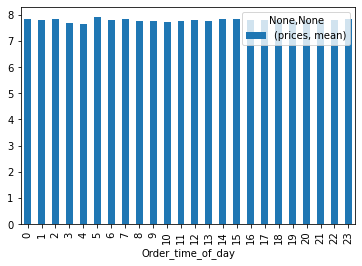

In [71]:
df.groupby('Order_time_of_day').agg({'prices': ['mean']}).plot.bar()

## End of the excercise

### contents
### groupby
### pd.options.display.max_rows = None for showing all rows